In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
%matplotlib ipympl

In [3]:
routes = pd.read_csv('kaggle_data/routes.csv')

In [4]:
routes

,index,Airline,Airline ID,Source airport,Source airport ID,Destination airport,Destination airport ID,Codeshare,Stops,Equipment
0,0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2
...,...,...,...,...,...,...,...,...,...,...
67658,67658,ZL,4178,WYA,6334,ADL,3341,NaN,0,SF3
67659,67659,ZM,19016,DME,4029,FRU,2912,NaN,0,734
67660,67660,ZM,19016,FRU,2912,DME,4029,NaN,0,734
67661,67661,ZM,19016,FRU,2912,OSS,2913,NaN,0,734


In [5]:
route_counts = routes.groupby(['Source airport', 'Destination airport']).count().reset_index()

In [6]:
route_counts

,Source airport,Destination airport,index,Airline,Airline ID,Source airport ID,Destination airport ID,Codeshare,Stops,Equipment
0,AAE,ALG,1,1,1,1,1,0,1,1
1,AAE,CDG,1,1,1,1,1,0,1,1
2,AAE,IST,1,1,1,1,1,0,1,1
3,AAE,LYS,1,1,1,1,1,0,1,1
4,AAE,MRS,2,2,2,2,2,0,2,2
...,...,...,...,...,...,...,...,...,...,...
37590,ZYI,SZX,1,1,1,1,1,0,1,1
37591,ZYI,WUH,1,1,1,1,1,0,1,1
37592,ZYI,XIY,1,1,1,1,1,0,1,1
37593,ZYI,XMN,1,1,1,1,1,0,1,1


In [7]:
routes.groupby(['Source airport', 'Destination airport']).size().reset_index(name='count')['count'].compare(route_counts['Airline'])

,self,other


In [8]:
route_counts['Airline']

0        1
1        1
2        1
3        1
4        2
        ..
37590    1
37591    1
37592    1
37593    1
37594    4
Name: Airline, Length: 37595, dtype: int64

In [9]:
routes.groupby(['Source airport', 'Destination airport']).size().reset_index(name='count')['count'] != route_counts['Airline']

0        False
1        False
2        False
3        False
4        False
         ...  
37590    False
37591    False
37592    False
37593    False
37594    False
Length: 37595, dtype: bool

In [10]:
route_counts = route_counts[['Source airport', 'Destination airport', 'Airline']]

In [11]:
# take only routes traveled by at least 5 airlines (hopefully a rough measure of importance)
route_subset = route_counts[route_counts['Airline'] >= 5]
source_airports = set(route_subset['Source airport'].unique())
destination_airports = set(route_subset['Destination airport'].unique())

In [12]:
route_subset

,Source airport,Destination airport,Airline
55,ABJ,ACC,7
69,ABJ,LFW,5
73,ABJ,OUA,7
79,ABQ,ATL,5
90,ABQ,LAX,5
...,...,...,...
37187,YZF,YEG,6
37221,YZV,YWK,5
37463,ZRH,LIS,6
37516,ZRH,VIE,5


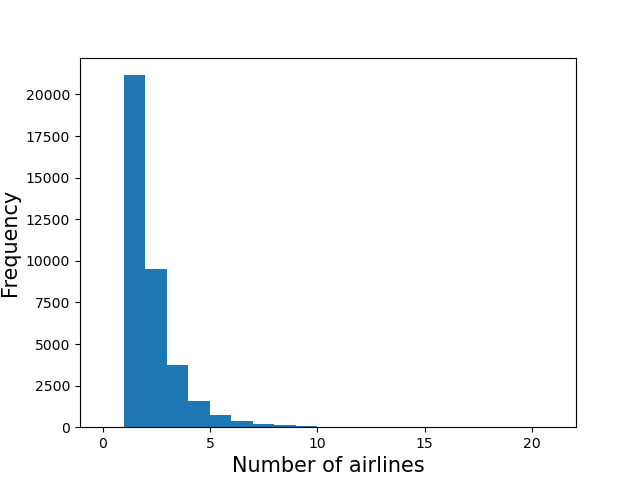

In [13]:
ax = route_counts.hist('Airline', bins=range(22))[0,0]
ax.set_title('')
ax.grid()
ax.set_xlabel("Number of airlines", fontsize=15)
ax.set_ylabel("Frequency", fontsize=15)
ax.tick_params(labelsize=10)
plt.savefig("total_airlines_dist.pdf")

In [14]:
route_subset.sort_values('Airline')

,Source airport,Destination airport,Airline
2371,AYT,DUS,5
37068,YYZ,DTW,5
37067,YYZ,DFW,5
27639,PSP,SFO,5
27450,PRG,CDG,5
...,...,...,...
22165,MIA,ATL,12
14554,HKT,BKK,13
25366,ORD,MSY,13
2038,ATL,ORD,19


In [15]:
len(source_airports)

370

In [16]:
len(destination_airports)

359

In [17]:
# take a union of all of the airports (either source or destination)
airports_subset = source_airports | destination_airports

In [18]:
len(source_airports & destination_airports)

344

In [19]:
len(airports_subset)

385

In [20]:
airports_data = pd.read_csv('kaggle_data/airports.csv')

In [21]:
airports_data

,index,Airport ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
0,0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7693,7693,14106,Rogachyovo Air Base,Belaya,Russia,\N,ULDA,71.616699,52.478298,272,\N,\N,\N,airport,OurAirports
7694,7694,14107,Ulan-Ude East Airport,Ulan Ude,Russia,\N,XIUW,51.849998,107.737999,1670,\N,\N,\N,airport,OurAirports
7695,7695,14108,Krechevitsy Air Base,Novgorod,Russia,\N,ULLK,58.625000,31.385000,85,\N,\N,\N,airport,OurAirports
7696,7696,14109,Desierto de Atacama Airport,Copiapo,Chile,CPO,SCAT,-27.261200,-70.779198,670,\N,\N,\N,airport,OurAirports


In [22]:
airports_data_subset = airports_data[airports_data["IATA"].isin(airports_subset)]

In [23]:
# check for missing airports data
airports_subset - set(airports_data_subset["IATA"])

{'INC'}

In [24]:
# get long-lat coordinates of each airport
long_lat_pairs = zip(airports_data_subset['Longitude'], airports_data_subset['Latitude'])
pos = dict(zip(airports_data_subset['IATA'], long_lat_pairs))
# fill in missing data
pos.update({'INC': (106.3925, 38.321667)})

In [25]:
# create graph with edges weighted by number of airlines
G = nx.DiGraph()
G.add_nodes_from(airports_subset)
G.add_weighted_edges_from(zip(route_subset['Source airport'], route_subset['Destination airport'], route_subset['Airline']))

In [26]:
G_cc = G.subgraph(max(nx.weakly_connected_components(G), key=len)).copy()

In [27]:
len(G_cc)

347

In [28]:
G = G_cc
indeg = G.in_degree()
outdeg = G.out_degree()

In [29]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.basemap import Basemap as Basemap #if you're having trouble importing this package
# try '[pip/conda/whatever package manager] install basemap'

basemap_world = Basemap(
        projection='merc',
        llcrnrlon=-180,
        llcrnrlat=-70,
        urcrnrlon=180,
        urcrnrlat=80,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True
)

# the bounds on this one are closer to contiguous US, Mexico, Canada
# for diff data the bounds might be expanded to show more
basemap_na = Basemap(
        projection='merc',
        llcrnrlon=-130,
        llcrnrlat=10,
        urcrnrlon=-50,
        urcrnrlat=60,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True
)

basemap_eu = Basemap(
        projection='merc',
        llcrnrlon=-25,
        llcrnrlat=15,
        urcrnrlon=60,
        urcrnrlat=65,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True
)

basemap_asia = Basemap(
        projection='merc',
        llcrnrlon=70,
        llcrnrlat=-10,
        urcrnrlon=145,
        urcrnrlat=60,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True
)
    
    
def plot_network(G, basemap, pos, cbar=True, ax=None):
    """
    Draws the graph G on the basemap.

    Parameters
    ----------
    G : any NetworkX graph type
        Graph to be plotted. 

    basemap : mpl_toolkits.Basemap
        Basemap to be plotted on

    pos : dict
        Coordinates of each node on the basemap. Keys should be the name of
        the node, values should be tuples of (long, lat) coords.
        
    ax : Matplotlib Axes object, or None, optional
        Plot on the specified axis. If None, plot on new axis.
    """

    if not ax:
        fig, ax = plt.subplots(figsize=(20,10))

    # transform positions based on basemap
    pos = {label : basemap(*coord) for label, coord in pos.items()}
    
    # plot basemap
    basemap.fillcontinents(color='#BBBBBB', ax=ax)
    basemap.drawstates(color='#888888', ax=ax)

    edgelist = list(G.edges())
    weights = [G.edges()[edge]['weight'] for edge in edgelist]
    
    # plot graph
    cmap = mpl.colormaps['viridis']
    nx.draw(
        G, 
        pos,
        edgelist=edgelist,
        ax=ax, 
        node_size=3,
        node_color='black',
        edge_cmap=cmap,
        edge_color=weights,
        edge_vmin=min(weights),
        edge_vmax=max(weights),
        alpha=0.2,
    )
    if cbar:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(weights), vmax=max(weights)))
        sm._A=[]
        bar = plt.colorbar(sm, ax=ax)
        bar.set_label('Number of airlines', size=20)
        bar.ax.tick_params(labelsize=15)

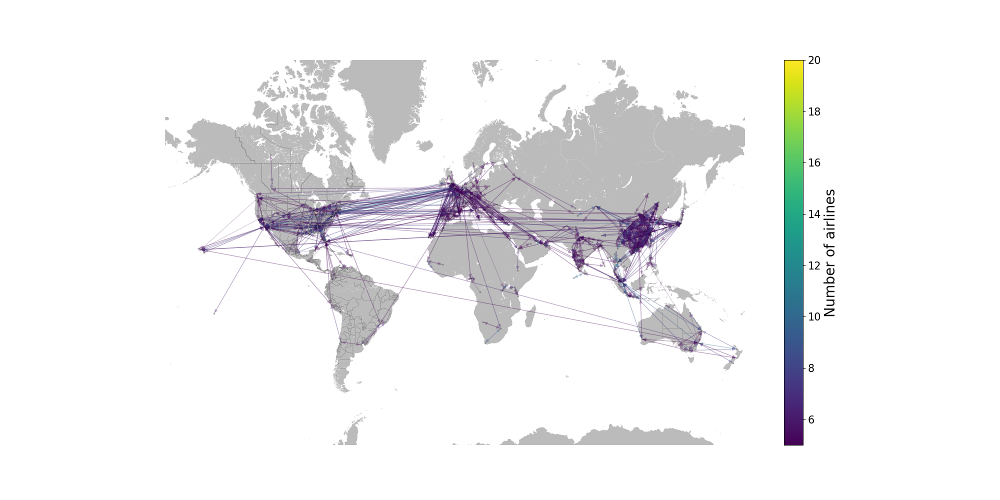

In [30]:
plot_network(G, basemap_world, pos)
plt.savefig("5+_airlines_network.pdf")

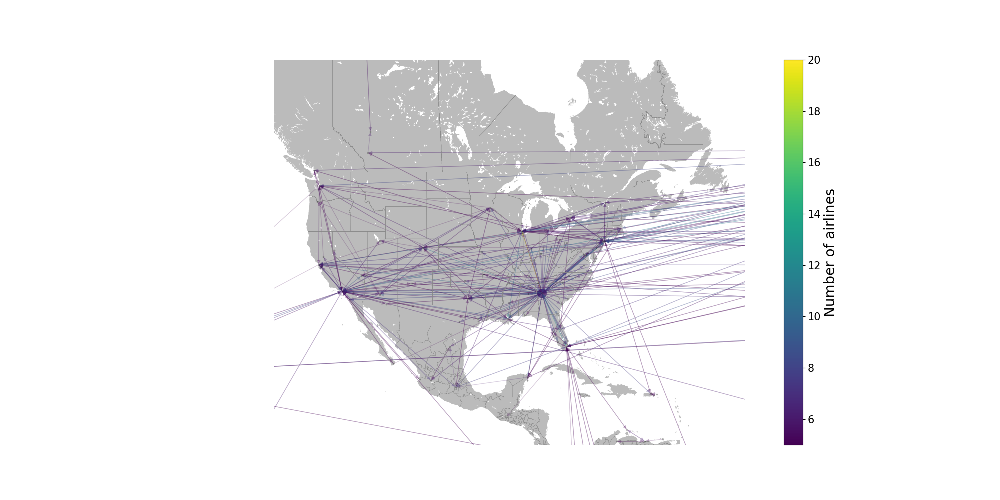

In [31]:
plot_network(G, basemap_na, pos)

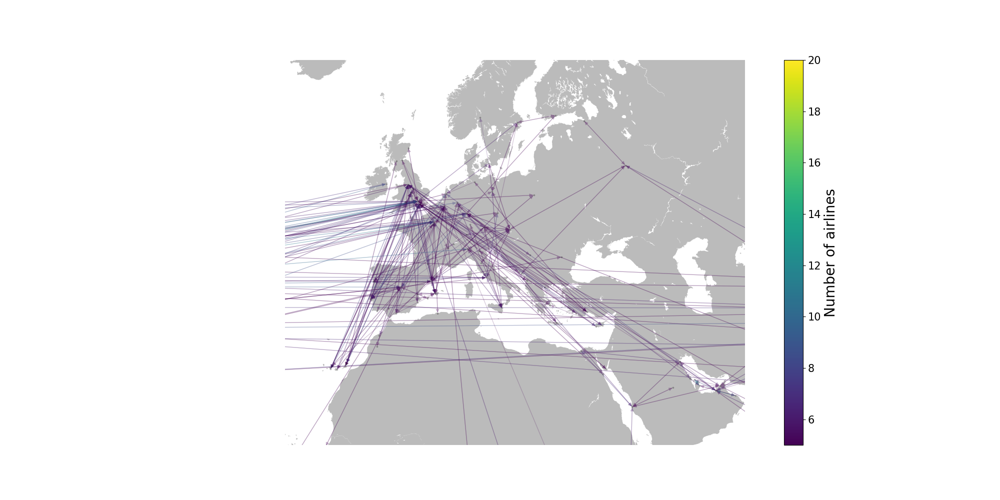

In [32]:
plot_network(G, basemap_eu, pos)

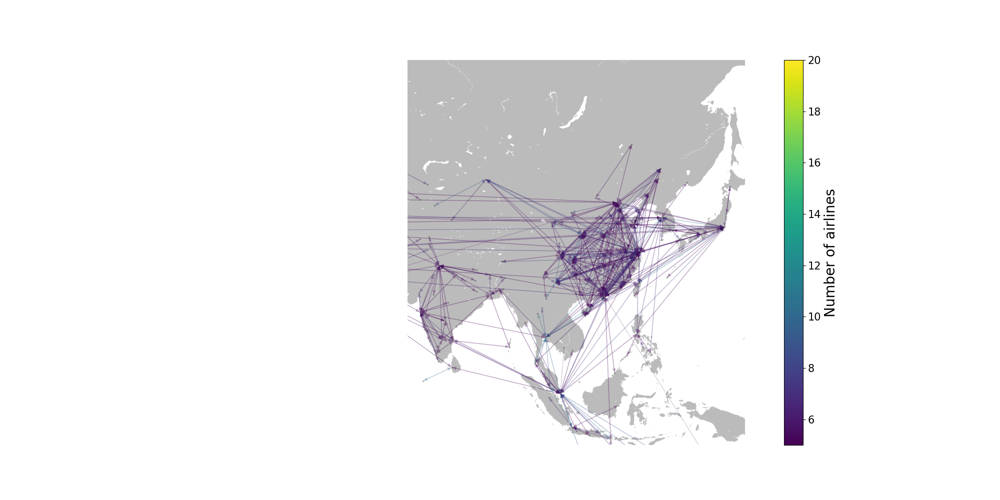

In [33]:
plot_network(G, basemap_asia, pos)

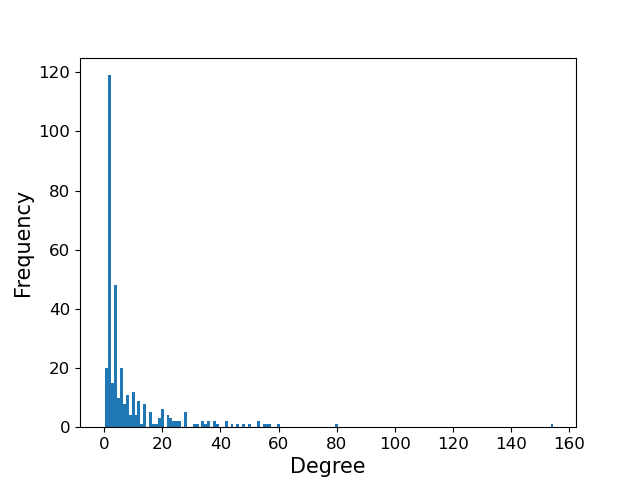

In [34]:
fig, ax = plt.subplots()
degrees = nx.degree_histogram(G)
plt.bar(range(len(degrees)), degrees, width=1)
plt.tick_params(labelsize=12)
plt.xlabel("Degree", fontsize=15)
plt.ylabel("Frequency", fontsize=15)
plt.savefig("degree_distribution.pdf")
# plt.savefig("degree_5+_airlines.png")

In [35]:
def plot_closeness_centrality(closeness, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.hist(closeness.values())
    ax.set_xlabel("Closeness centrality", fontsize=15)
    ax.set_ylabel("Frequency", fontsize=15)
    ax.tick_params(labelsize=12)

def plot_betweenness_centrality(betweenness, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.hist(betweenness.values(),bins=100)
    ax.set_xlabel("Betweenness centrality", fontsize=15)
    ax.set_ylabel("Frequency", fontsize=15)
    ax.tick_params(labelsize=12)

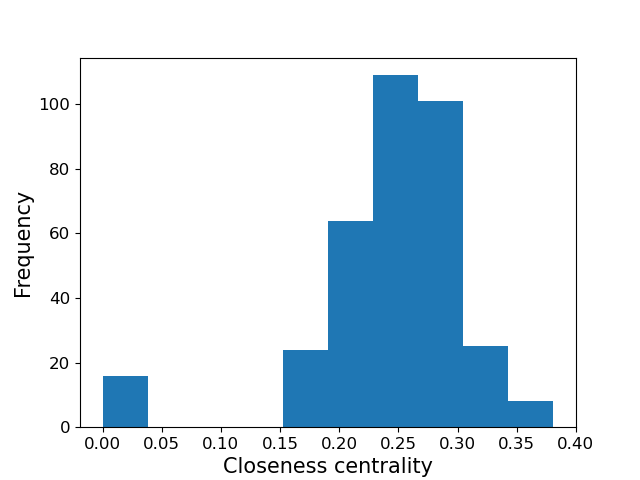

In [36]:
closeness = nx.closeness_centrality(G)
plot_closeness_centrality(closeness)
plt.savefig("closeness_distribution.pdf")

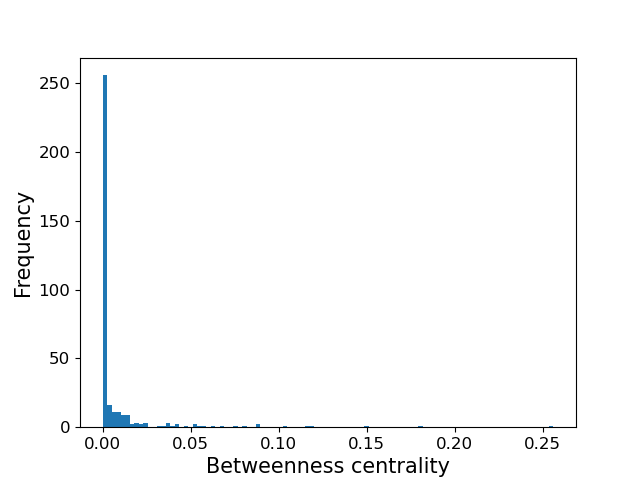

In [37]:
betweenness = nx.betweenness_centrality(G, normalized=True)
plot_betweenness_centrality(betweenness)
plt.savefig("betweenness_distribution.pdf")

In [38]:
def summary(G, plot=True):
    print(f"Weakly connected components: {nx.number_weakly_connected_components(G)}")
    print(f"Strongly connected components: {nx.number_strongly_connected_components(G)}")
    closeness = nx.closeness_centrality(G)
    betweenness = nx.betweenness_centrality(G)
    print(f"Top 5 closeness nodes")
    print(sorted(closeness.items(), key=lambda i: i[1], reverse=True)[:5])
    print(f"Top 5 betweenness nodes")
    print(sorted(betweenness.items(), key=lambda i: i[1], reverse=True)[:5])
    if plot:
        fig = plt.figure(figsize=(20,20))
        subfigs = fig.subfigures(2)
        ax_hist = subfigs[0].subplots(1,2)
        plot_closeness_centrality(closeness, ax=ax_hist[0])
        plot_betweenness_centrality(betweenness, ax=ax_hist[1])
        ax_world = subfigs[1].subplots()
        plot_network(G, basemap_world, pos, ax=ax_world)
       #  ax_world_sub = subfigs[2].subplots(1,3)
       #  plot_network(G, basemap_na, pos, ax=ax_world_sub[0], cbar=False)
       #  plot_network(G, basemap_eu, pos, ax=ax_world_sub[1], cbar=False)
       #  plot_network(G, basemap_asia, pos, ax=ax_world_sub[2], cbar=False)
        plt.show()

In [39]:
summary(G, plot=False)

Weakly connected components: 1
Strongly connected components: 27
Top 5 closeness nodes
[('ORD', 0.3810410222676315), ('LHR', 0.3787483566703533), ('LAX', 0.3787483566703533), ('JFK', 0.37693399328510613), ('ATL', 0.3724732359681226)]
Top 5 betweenness nodes
[('ATL', 0.25613028494033685), ('LHR', 0.17975562518436722), ('LAX', 0.1500091901747226), ('JFK', 0.11815699987266137), ('ORD', 0.11624160729025955)]


In [40]:
def copy_remove_node(G, node_name):
    Gnew = G.copy()
    Gnew.remove_node(node_name)
    return Gnew

def remove_highest_closeness_node(G):
    closeness = nx.closeness_centrality(G)
    sorted_closeness = sorted(closeness.items(), key=lambda i: i[1])
    highest_closeness_node, max_closeness = sorted_closeness[-1]
    print(f"Removing node {highest_closeness_node} with closeness {max_closeness}")
    return copy_remove_node(G, highest_closeness_node)
    
def remove_highest_betweenness_node(G):
    betweenness = nx.betweenness_centrality(G)
    sorted_betweenness = sorted(betweenness.items(), key=lambda i: i[1])
    highest_betweenness_node, max_betweenness = sorted_betweenness[-1]
    print(f"Removing node {highest_betweenness_node} with betweenness {max_betweenness}")
    return copy_remove_node(G, highest_betweenness_node)

In [41]:
# Removing nodes by highest closeness centrality
G_prev = G
summary(G_prev, plot=False)
print("")
for i in range(10):
    G_next = remove_highest_closeness_node(G_prev)
    print("--------")
    summary(G_next, plot=False)
    print("")
    G_prev = G_next
G_closeness_removed = G_next

Weakly connected components: 1
Strongly connected components: 27
Top 5 closeness nodes
[('ORD', 0.3810410222676315), ('LHR', 0.3787483566703533), ('LAX', 0.3787483566703533), ('JFK', 0.37693399328510613), ('ATL', 0.3724732359681226)]
Top 5 betweenness nodes
[('ATL', 0.25613028494033685), ('LHR', 0.17975562518436722), ('LAX', 0.1500091901747226), ('JFK', 0.11815699987266137), ('ORD', 0.11624160729025955)]

Removing node ORD with closeness 0.3810410222676315
--------
Weakly connected components: 1
Strongly connected components: 27
Top 5 closeness nodes
[('LHR', 0.3775475679729329), ('LAX', 0.37664109121909634), ('JFK', 0.37573895686887093), ('ATL', 0.37085346215780995), ('SFO', 0.35172873204653277)]
Top 5 betweenness nodes
[('ATL', 0.2610199846470071), ('LHR', 0.19606519507585238), ('LAX', 0.17957607096552708), ('JFK', 0.15866186477748623), ('SIN', 0.10532380018347798)]

Removing node LHR with closeness 0.3775475679729329
--------
Weakly connected components: 4
Strongly connected compone

Weakly connected components: 77
Strongly connected components: 103
Top 5 closeness nodes
[('HKG', 0.14786146313364054), ('BCN', 0.14762849584278157), ('PVG', 0.14609419464997153), ('BKK', 0.14213039867109634), ('MAD', 0.13840171485260772)]
Top 5 betweenness nodes
[('BCN', 0.042418628773396465), ('BKK', 0.03908825550275052), ('LGW', 0.03537947851225867), ('FRA', 0.03287794600960911), ('HKG', 0.03162042652946202)]


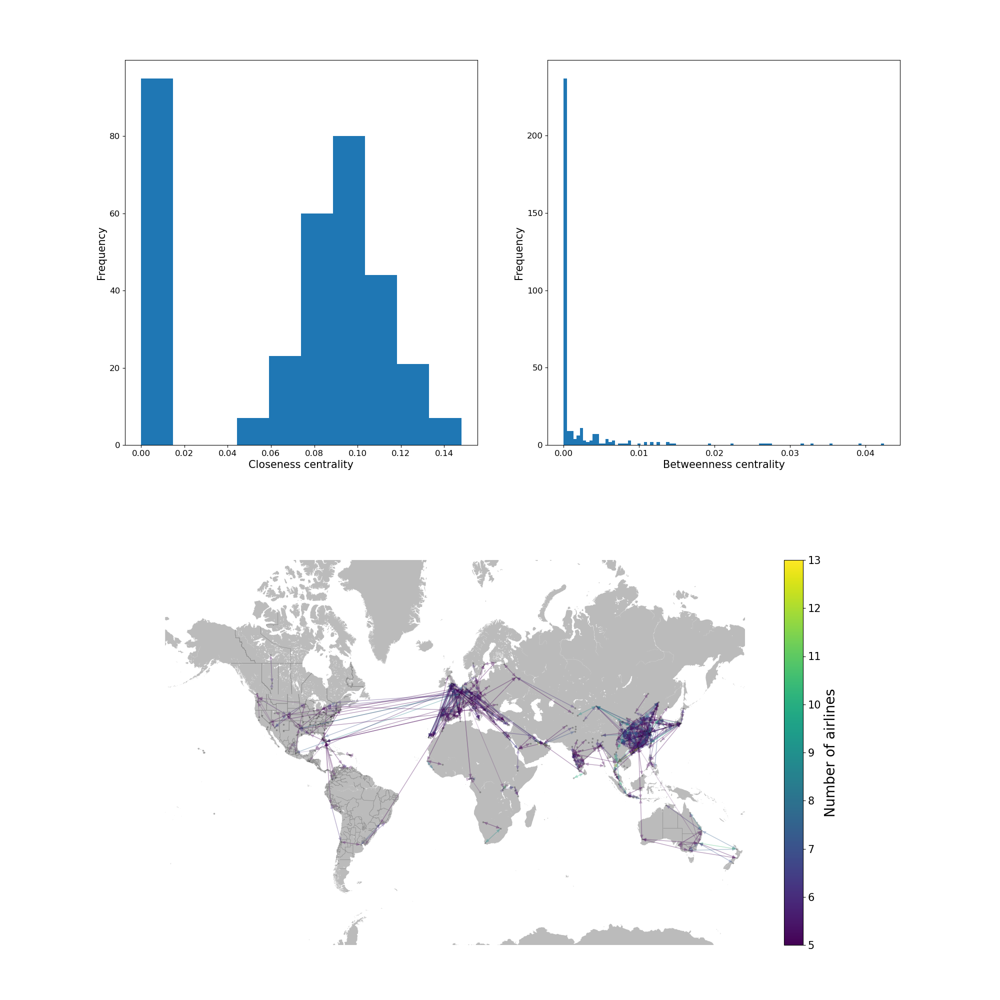

In [42]:
summary(G_closeness_removed)

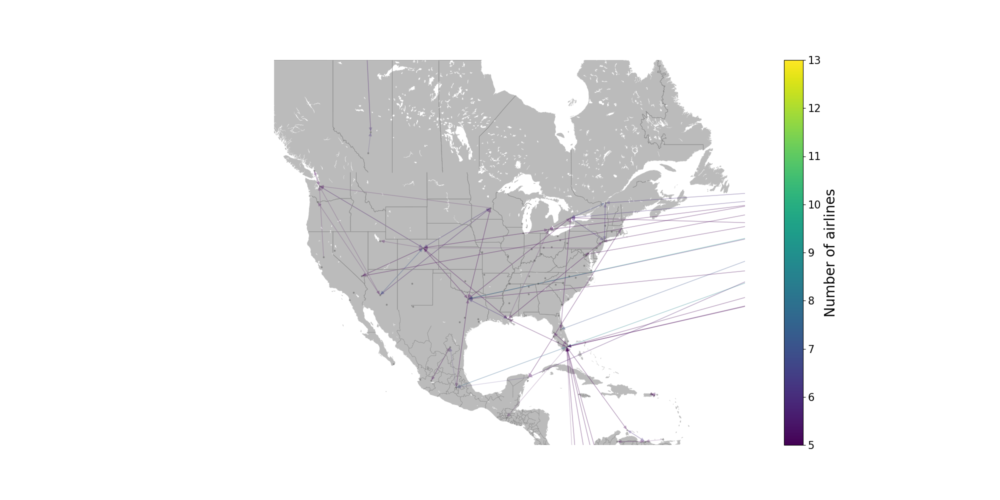

In [43]:
plot_network(G_closeness_removed, basemap_na, pos)

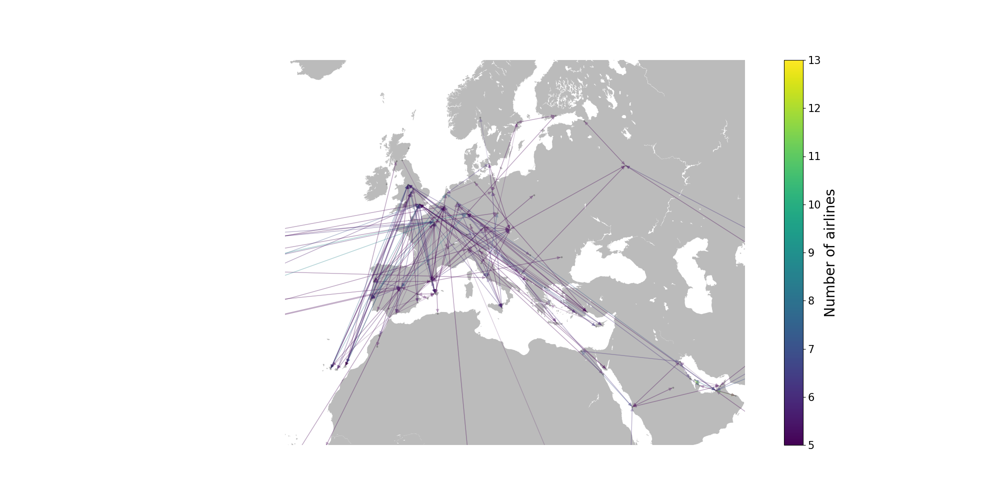

In [44]:
plot_network(G_closeness_removed, basemap_eu, pos)

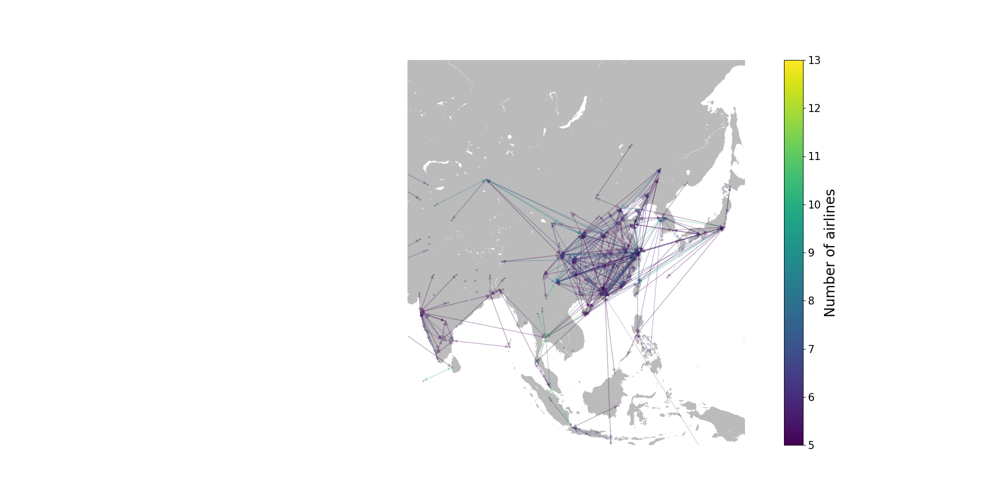

In [45]:
plot_network(G_closeness_removed, basemap_asia, pos)

In [46]:
# Removing nodes by highest closeness centrality
G_prev = G
summary(G_prev, plot=False)
print("")
for i in range(10):
    G_next = remove_highest_betweenness_node(G_prev)
    print("--------")
    summary(G_next, plot=False)
    print("")
    G_prev = G_next
G_betweenness_removed = G_next

Weakly connected components: 1
Strongly connected components: 27
Top 5 closeness nodes
[('ORD', 0.3810410222676315), ('LHR', 0.3787483566703533), ('LAX', 0.3787483566703533), ('JFK', 0.37693399328510613), ('ATL', 0.3724732359681226)]
Top 5 betweenness nodes
[('ATL', 0.25613028494033685), ('LHR', 0.17975562518436722), ('LAX', 0.1500091901747226), ('JFK', 0.11815699987266137), ('ORD', 0.11624160729025955)]

Removing node ATL with betweenness 0.25613028494033685
--------
Weakly connected components: 40
Strongly connected components: 65
Top 5 closeness nodes
[('ORD', 0.3240828046485459), ('LAX', 0.3227864734299517), ('LHR', 0.32192799876657413), ('JFK', 0.3206488146655149), ('NRT', 0.313994623959097)]
Top 5 betweenness nodes
[('LHR', 0.15673529867635114), ('LAX', 0.14236805347132525), ('JFK', 0.11663745476548674), ('SIN', 0.09844052548648122), ('ORD', 0.09507836476730352)]

Removing node LHR with betweenness 0.15673529867635114
--------
Weakly connected components: 43
Strongly connected co

Weakly connected components: 69
Strongly connected components: 94
Top 5 closeness nodes
[('DEL', 0.1544043503313166), ('DXB', 0.1529501997716895), ('BOM', 0.15165181097906055), ('JED', 0.14936942586399107), ('BKK', 0.14619135297326785)]
Top 5 betweenness nodes
[('DEL', 0.2872789327173655), ('DXB', 0.26961309523809524), ('BKK', 0.265012982771062), ('BOM', 0.2600180644397062), ('FRA', 0.2584932926683993)]


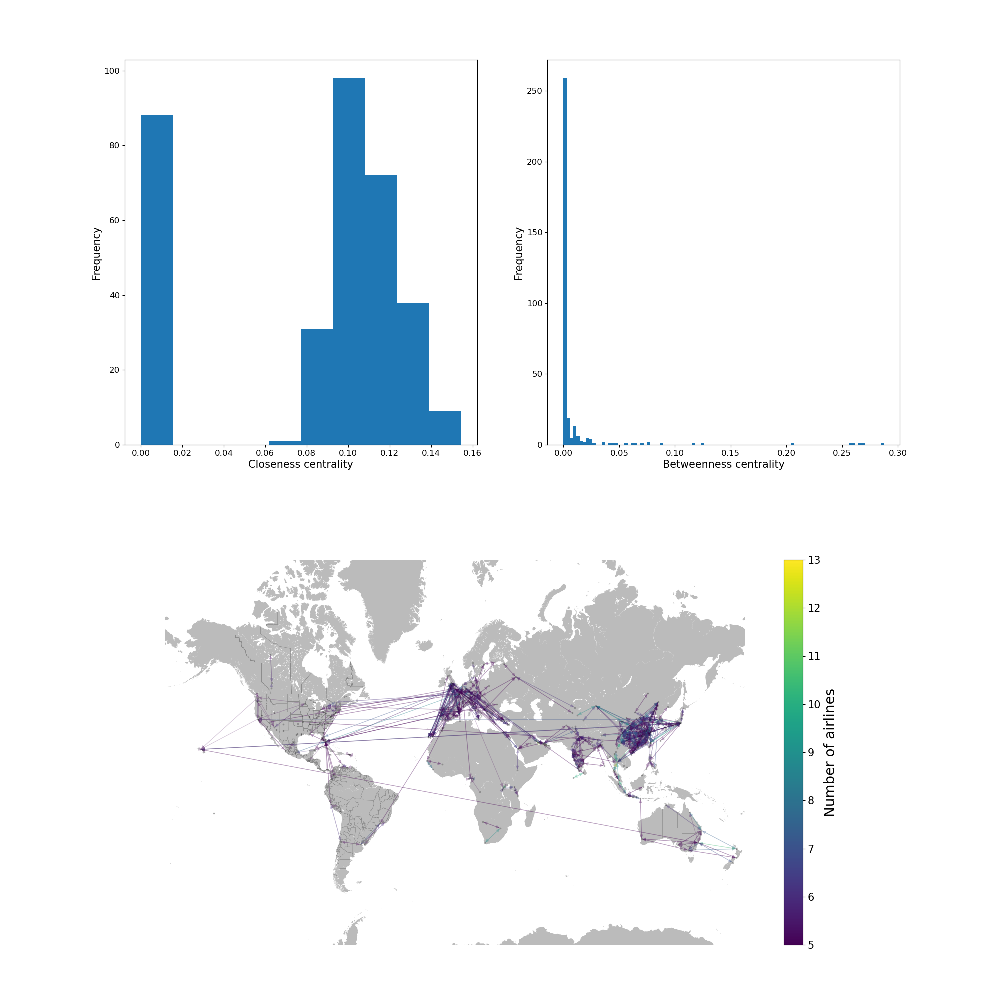

In [47]:
summary(G_betweenness_removed)

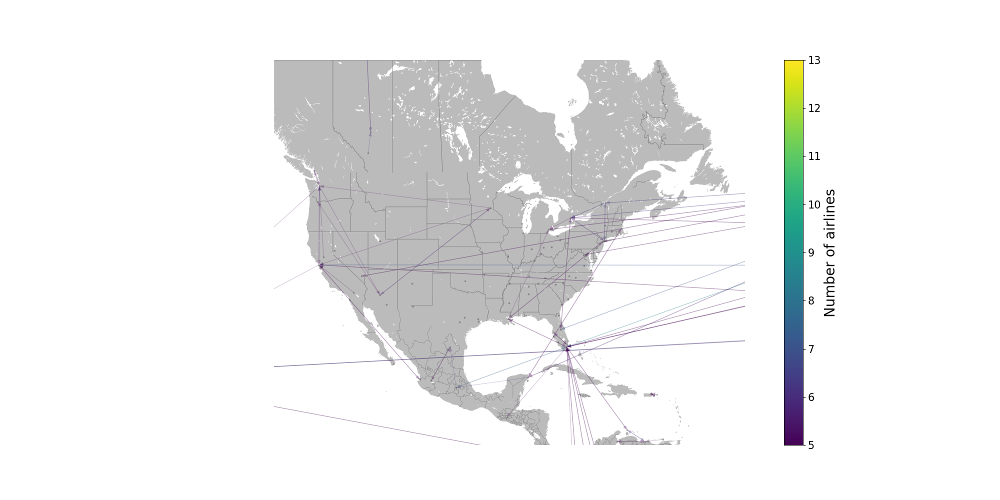

In [48]:
plot_network(G_betweenness_removed, basemap_na, pos)

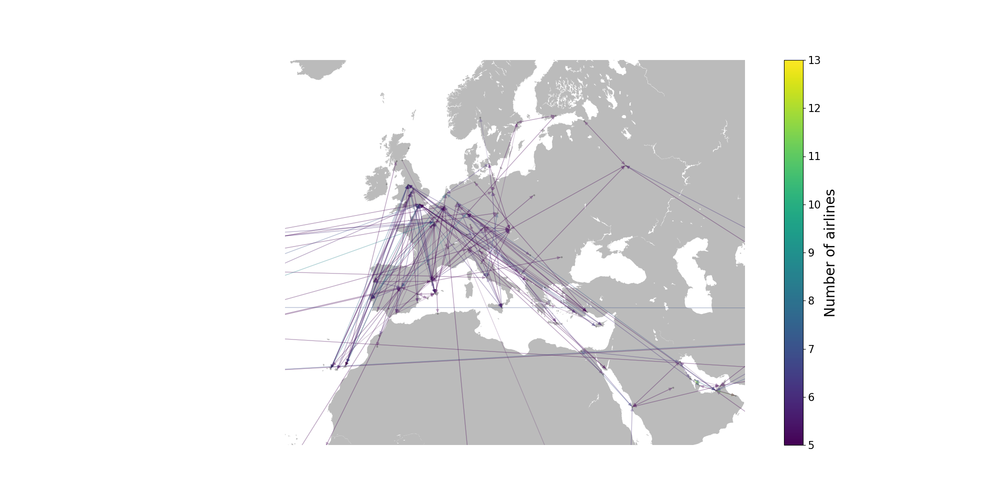

In [49]:
plot_network(G_betweenness_removed, basemap_eu, pos)

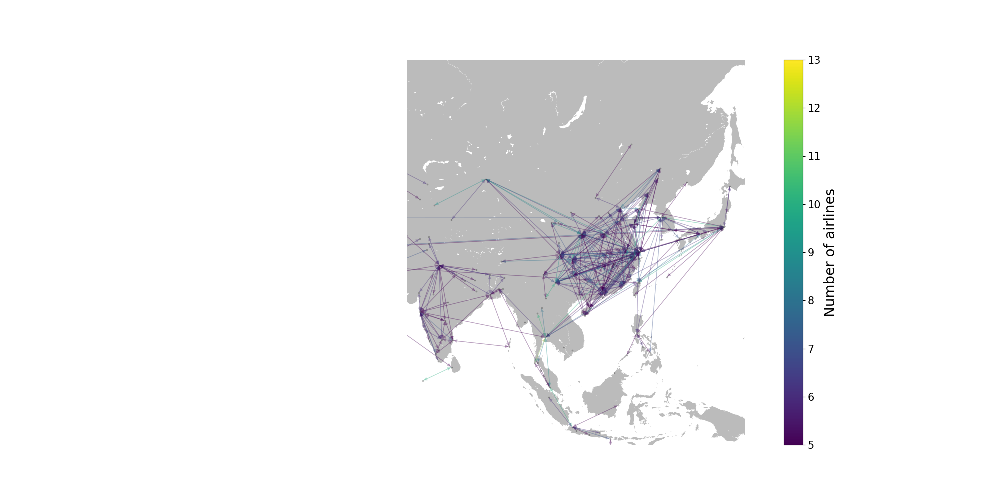

In [50]:
plot_network(G_betweenness_removed, basemap_asia, pos)